In [2]:
import numpy as np
import pandas as pd

import scanpy as sc
import anndata as ad

In [7]:
import matplotlib.pyplot as plt
sc.settings.set_figure_params(dpi=80, frameon=False)
sc.set_figure_params(dpi=80)
sc.set_figure_params(figsize=(4, 4))
plt.rcParams['figure.dpi'] = 80
plt.rcParams['figure.figsize'] = (4, 4)

In [4]:
adata=sc.read("mg_6_7_8_9_velo_refint.h5ad")
adata

/Users/royaab/py310/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 2256 × 3991
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'outlier', 'mt_outlier', 'cellID', 'barcode', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'batch', 'sample', 'mod_barcode', 'leiden_0.7', 'leiden_0.9', 'leiden_1', 'leiden_1.2', 'leiden_1.4'
    var: 'mt', 'Accession', 'End', 'Start', 'Strand', 'n_cells_by_counts-WT_01', 'mean_counts-WT_01', 'log1p_mean_counts-WT_01', 'pct_dropout_by_counts-WT_01', 'total_counts-WT_01', 'log1p_total_counts-WT_01', 'n_cells-WT_01', 'Chromosome-WT_01', 'n_cells_by_counts-WT_02', 'mean_counts-WT_02', 'log1p_mean_counts-WT_02', 'pct_dropout_by_counts-WT_02', 'total_counts-WT_02', 'log1p_total_counts-WT_02', 'n_cells-WT_02', 'Chromosome-WT_02', 'Gene_name-WT_02', 

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


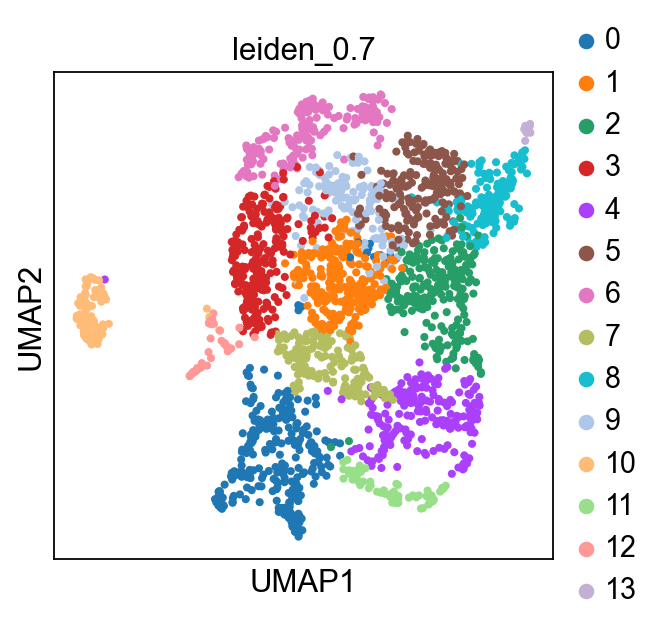

In [8]:
sc.pl.umap(adata, color="leiden_0.7")

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


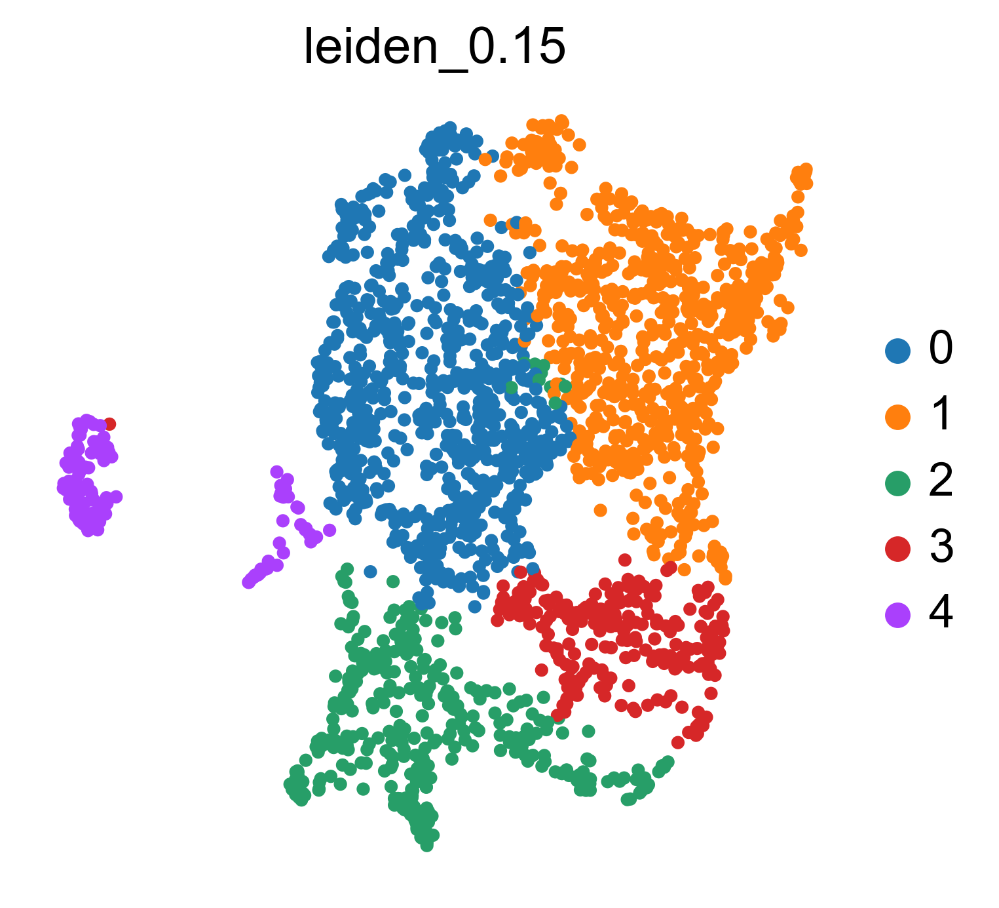

In [19]:
sc.tl.leiden(adata, resolution=0.15, key_added="leiden_0.15")
sc.pl.umap(adata, color="leiden_0.15", frameon=False)

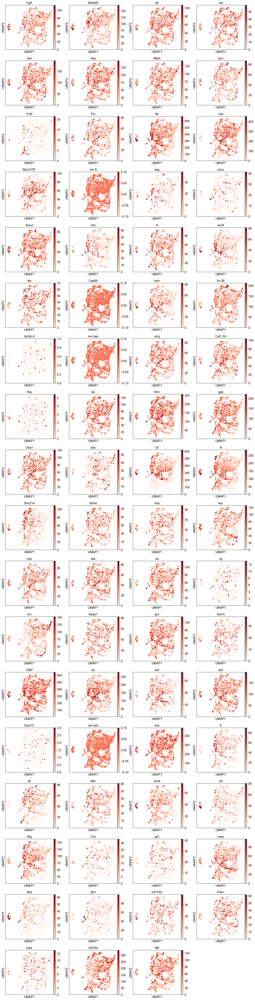

In [83]:
sc.pl.umap(adata, color=["Egfr", "Stat92E", "yki", "Jra", "bsk", "hep", "Mkk4", 
                         "puc", "Pvf2", "Pvr", "ttk", "nub","Myo31DF", "mir-8", "esg", 
                         "pros", "Amun", "chn", "H", "aurB", "dia", 
                        "Cep89", "borr", "lin-28", "Hs3st-A", "mir-ban", "simj",
                         "Caf1-55", "Hey", "da", "Smr", "gpp", "Uba1", "ken",
                        "Dl", "N", "Sox21a", "dome", "hop", "kay", "hpo", "wts", 
                         "sd", "vg", "cnc", "Keap1", "gro", "Su(H)", "CtBP", "cic", 
                         "pnt", "bsk", "Ets21C", "mir-ban", "lola", "ft", "ds", "Mer",
                        "scrib", "crb", "Nrg", "Con", "grh", "mam", "zfh2", "zfh1", "mtTFB2",
                        "Pink1", "park", "GATAe", "M6"], 
           cmap="Reds", vmax="p99", use_raw=True)

In [43]:
from matplotlib.pyplot import rc_context

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:368: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


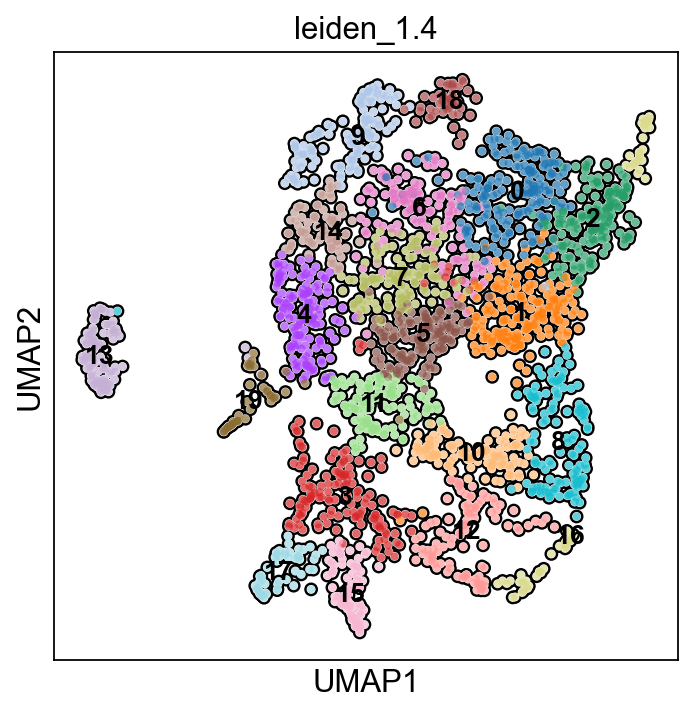

In [45]:
with rc_context({"figure.figsize": (5, 5)}):
    sc.pl.umap(
        adata,
        color="leiden_1.4",
        add_outline=True,
        legend_loc="on data",
        legend_fontsize=12
    )

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


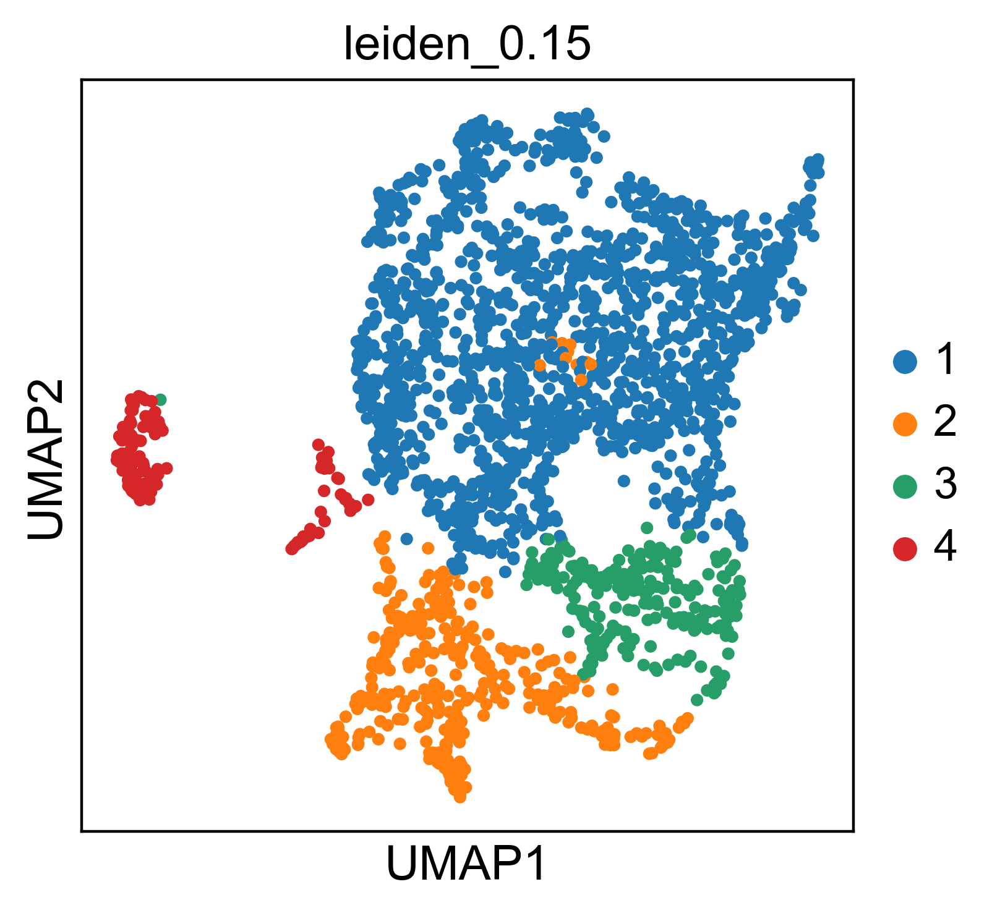

In [18]:
adata.obs["leiden_0.15"]=adata.obs["leiden_0.15"].replace({"0":"1"})
sc.pl.umap(adata, color="leiden_0.15")

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


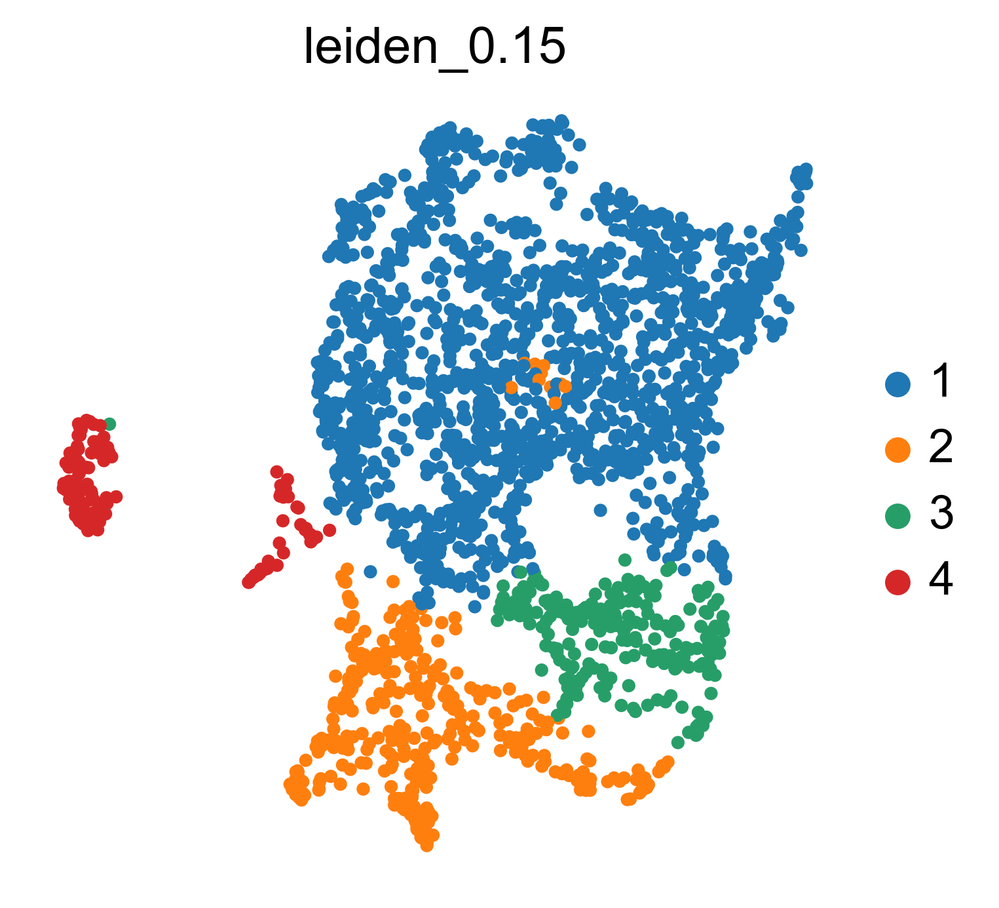

In [16]:
sc.pl.umap(adata, color="leiden_0.15", frameon=False)

In [8]:
adata.X=adata.layers["raw_counts"].copy()

In [9]:
adata.X

array([[ 11.,  23.,   0., ...,  12.,  13.,   1.],
       [  0.,   0.,   0., ...,   8.,  27.,  28.],
       [  0.,  55.,   0., ...,   2.,   0.,  65.],
       ...,
       [ 38.,   0.,   0., ...,  10.,  14.,  21.],
       [ 54., 122.,   0., ...,  32., 178.,   8.],
       [ 21.,   1.,   0., ...,  19.,  16.,  79.]], dtype=float32)

In [10]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [12]:
sc.tl.rank_genes_groups(adata, groupby="leiden_0.15", method="wilcoxon", use_raw=False)

/Users/royaab/py310/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:748: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


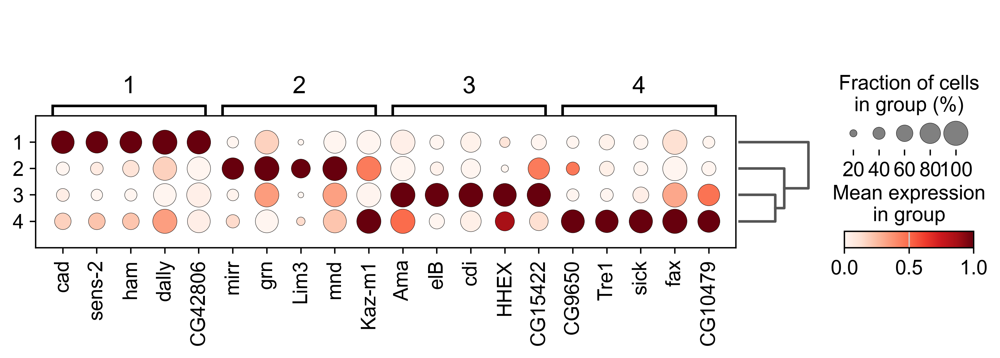

In [15]:
sc.pl.rank_genes_groups_dotplot(adata, standard_scale="var", n_genes=5)